# MIKSERI - Accessibility Distances

Short description in Finnish: 
*Saavutettavuuslaskenta: etäisyys lähimpään palveluun kävelytieverkossa. Osa [MIKSERI-hankkeen](https://www.syke.fi/hankkeet/mikseri) analyysejä*. 

Process for finding distance to closest service(s) from each network node in a study area related to the MIKSERI-project (*Lähiympäristöjen kehittäminen kaupunkikudosten ja toiminnallisen sekoittuneisuuden näkökulmasta*) that focuses on urban development from the perspective of functional mixes across urban fabrics. 
[MIKSERI project description in Finnish.](https://www.syke.fi/fi-FI/Tutkimus__kehittaminen/Tutkimus_ja_kehittamishankkeet/Hankkeet/Lahiymparistojen_kehittaminen_kaupunkikudosten_ja_toiminnallisen_sekoittuneisuuden_nakokulmasta)

## Notes about input data
This notebook demonstrates the approach using open source data only. Modify `fp_dicts.py` to add more services from various sources. Example process is from Lappeenranta, Finland but this workflow is applicable to anywhere in the world with adequate OpenStreetMap data coverage.

**This example focuses on walking distances**, but you can modify the script to get travel distances by biking and car. (adjust `network_type` when using [pyrosm get_network()](https://pyrosm.readthedocs.io/en/latest/reference.html)).

Network data were downloaded as protobuf files following [the pyrosm documentation](https://pyrosm.readthedocs.io/en/latest/basics.html#what-to-do-if-you-cannot-find-the-data-for-your-area-of-interest). You need to fetch the network data separately prior to running this process.

## Preparations & Usage

This notebook is run once per study area. Prior to running, set the desired area of interest, and check filepaths for input and output data. See "Input data and custom settings -section for details". 

You need to have these input files ready prior to running the notebook: 

1. a vector file delineating the study area boundary
2. a protobuf file containing the OpenStreetMap data (used for building the street network)
3. service locations (shapefile or geopackage) for defining the destinations in the analysis.

Output(s):

1. Network nodes with distance column per service type (indicates distance to nearest facility)
2. Grid file with distance column per service type (indicates median distance to nearest facility)

Pay attention to:
- Coordinate reference systems of input files
- distance settings in the accessibility analysis
- Output saving options (some output savings are disabled by default to save time).

In other words, you need to put a little bit effort to apply this process to other areas!

Processing times depend on the size of the region: 
- Tampere:  ~ 3 minutes excluding visualizations, and ~8-9 minutes including visualizations 
- Lappeenranta: ~ 1 minute excluding visualizations, and ~3-4 minutes including visualizations 

## Main tools:
- [pyrosm](https://pyrosm.readthedocs.io/en/latest/) for fetching OSM data: `"Pyrosm is a Python library for reading OpenStreetMap from Protocolbuffer Binary Format -files (*.osm.pbf) into Geopandas GeoDataFrames."`
- [pandana](https://github.com/UDST/pandana) for network analysis `"Pandana is a Python library for network analysis that uses contraction hierarchies to calculate super-fast travel accessibility metrics and shortest paths."` Conference pubication describing the approach: [Foti et al. 2012](http://onlinepubs.trb.org/onlinepubs/conferences/2012/4thITM/Papers-A/0117-000062.pdf)
    

## References:
- Network data: OpenStreetMap Contributors 2021
- Service locations: OpenStreetMap contributors 2021, A.C. Nielsen 2018, THL, Tilastokeskus
- Method: 
    - pandana: [Foti et al. 2012](http://onlinepubs.trb.org/onlinepubs/conferences/2012/4thITM/Papers-A/0117-000062.pdf)
    - pyrosm: [Tenkanen & pyrosm contributors 2021](https://pyrosm.readthedocs.io/en/latest/).

In [1]:
# System & filepaths
import os
import glob

# Dataframes and geodata
import pandas as pd
import geopandas as gpd
from pyproj import CRS
from shapely import wkb, wkt
import pyodbc
import shapely.wkt

# Plotting
import matplotlib.pyplot as plt
import contextily as ctx

# Tools for accessibility analysis
from pyrosm import OSM, get_data
import pandana

In [2]:
from matplotlib_scalebar.scalebar import ScaleBar

In [3]:
import datetime
import time
start = time.time()

In [4]:
# Copy this section wherever you want to print execution time 
meantime = time.time()
current_time = str(datetime.timedelta(seconds=round(meantime - start, 0)))
print("Notebook execution time so far: ", current_time)

Notebook execution time so far:  0:00:00


## Input data + custom settings

In [5]:
# Set area of interest in here. Refers to case_areas polygon layer
city = "Lappeenranta"

In [6]:
distance_treshold = 30000 # max walking distance in meters

In [7]:
# INSER ROOT FOLDERS HERE AND MODIFY filepath_dicts.py WITH APPROPRIATE FILENAMES!
protobuf_folder = r"../OSM_protobuf" # insert folder path
shp_folder = r"" # Insert folder if using additional shapefile input
osm_gpkg = fr"../results/downloaded_pois/OSM_{city}.gpkg"

In [8]:
import filepath_dicts as fp_dicts

In [9]:
# Example of available pre-downloaded layers:
print(fp_dicts.osm.keys())

dict_keys(['kirjastot', 'museot', 'hotellit', 'teatterit', 'elokuvateatterit', 'ravintolat', 'kahvilat', 'pubit_klubit'])


## Read case areas


In [10]:
case_areas_fp = r"..\case_areas\MIKSERI_case_areas.geojson"
case_areas = gpd.read_file(r"..\case_areas\MIKSERI_case_areas.geojson")

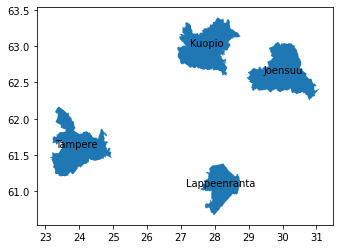

In [11]:
# Quick visualization
ax = case_areas.plot()

#Add region names
case_areas.apply(lambda x: ax.annotate(text=x["name"], 
                                       xy=x.geometry.centroid.coords[0], 
                                       ha='center'),axis=1);

In [12]:
case_areas.crs.name

'WGS 84'

### origin points

- calculates distances from each node in the network



### Destination points

- Services (see `filepath_dicts.py`)

## Network data

Using pyrosm to fetch the data, pandana for network analysis.

IF NEEDED Manually fetch protobuf  from BBBike extract tool: https://extract.bbbike.org/ following pyrosm documentation: https://pyrosm.readthedocs.io/en/latest/basics.html#what-to-do-if-you-cannot-find-the-data-for-your-area-of-interest

https://pyrosm.readthedocs.io/en/latest/basics.html#filtering-data-based-on-bounding-box

In [13]:
# Organization-spesicif proxy settings in separate file my_proxy.py - file is ignored by git.
# Might be needed for fetching OSM or background maps over the network.. (Comment out if not needed..)
from my_proxy import http_proxy

os.environ['http_proxy'] = http_proxy
os.environ['https_proxy'] = http_proxy

In [14]:
# Fetches and saves OSM data as protobuf to temp-folder using pyrosm
#osm = OSM(get_data("helsinki"))

In [15]:
# Manually fetched protobuf form mikseri case areas from BBBike extract tool: https://extract.bbbike.org/
# following pyrosm documentation: https://pyrosm.readthedocs.io/en/latest/basics.html#what-to-do-if-you-cannot-find-the-data-for-your-area-of-interest
pbf_files = fp_dicts.pbf_files

print("Keys:", pbf_files.keys())

# Example for accessing filename for selected city
pbf_files.get(city)

Keys: dict_keys(['Lappeenranta', 'Tampere', 'Joensuu', 'Kuopio'])


'planet_27.828,60.916_28.692,61.186.osm.pbf'

### Main tools used in the accessibility analysis: 
Connect points to the closest node in the network using pandana [set_pois()](http://udst.github.io/pandana/network.html#pandana.network.Network.set_pois)

```
Set the location of all the pois of this category. 
The pois are connected to the closest node in the Pandana network which assumes no impedance between the 
location of the variable and the location of the closest network node.
```

Find the distance to the nearest point-of-interest from each source node using pandana [nearest_pois()](http://udst.github.io/pandana/network.html#pandana.network.Network.nearest_pois)

```
Find the distance to the nearest pois from each source node. The bigger values in this case mean
less accessibility.
```

We also want to retrieve poi ids in addition to the distances, in order to identify which green space polygon was the closest by including parameter `include_poi_ids=True`.


Final result includes information for nearest n forest access points for each node in the network. In further analysis, we can then link this info to actual origin points (e.g. YKR grid centroids OR buildings)

### Helper functions

In [16]:
def generate_graph(city, protobuf_folder, network_type="walking"):
    """Execute steps for generating nodes, edges and a pandana network from custom protobuf file"""
    
    # Start analyzing osm data from one case area
    fp = os.path.join(protobuf_folder, city, pbf_files.get(city))
    osm = OSM(fp)

    # Get odes and edges as geodataframes 
    nodes, edges = osm.get_network(network_type=network_type, nodes=True)

    network = osm.to_graph(nodes, edges, graph_type="pandana")
    
    return nodes, edges, network

In [17]:
def subset_result(result_nodes, case_areas, area_name):
    """Subset result points with matching case area polygon"""
    
    # Geopandas overlay, retain intersecting point geometries
    s = gpd.overlay(result_nodes.to_crs(case_areas.crs), 
                    case_areas[case_areas["name"]==area_name], 
                    how="intersection")
    
    if s.crs != CRS.from_epsg(4326):
        s = s.to_crs(CRS.from_epsg(4326))
    
    return s

In [18]:
def prepare_service_points(point_gdf, case_areas, area_name):
    "prepare input points to the correct CRS and data structure that can be attached to the network"

    # subset to case area (to avoid edge effects etc.)
    service = subset_result(point_gdf, case_areas, area_name)

    # Handle CRS (should be ok but just in case)
    if service.crs != CRS.from_epsg(4326):
        service = service.to_crs(CRS.from_epsg(4326))

    # Add/update lat lon columns
    service["lon"] = service.geometry.x
    service["lat"] = service.geometry.y
    
    return service

In [19]:
def join_to_grid(grid, result_nodes, info_columns, stats="median", id_field="xyind"):
    """Summarize details from nodes to grid. Get mean or median depending on stats-parameter."""
    
    print("points before join:", len(result_nodes))

    # Do spatial join
    sjoin = gpd.sjoin(left_df=result_nodes.to_crs(grid.crs), right_df=grid, how='left', op='intersects')

    print("points after join:", len(sjoin))
    print("potential duplicates", len(sjoin) - len(sjoin.drop_duplicates(subset="id")))

    # Group info per grid square
    grouped = sjoin.groupby(by=id_field)

    # Get mean for each value from nodes within grid square (most likely nearby values are similar, can ispect more closely..)
    if stats == "median":
        summary = grouped[info_columns].median()
        
    if stats == "mean":
        summary = grouped[info_columns].mean()
    
    return summary

### Run analysis



In [20]:
# Get network data
nodes, edges, network = generate_graph(city=city, protobuf_folder=protobuf_folder)

In [21]:
# Create output gdf structure
result = nodes[['lon', 'lat', 'id', 'geometry']]

#### Repeat for shapefiles

NOTE!

There is a separate script for shapefile input and geopackage input. Could be made more elegant by combining the two and detecting input file format..

Shapefile input are not included in the demo repository; following code block won't process anyting. Modify input folder and filename details in order to add input files. 

In [22]:
# Accessibility to features stored in shapefiles..
categories = fp_dicts.shapefiles.keys()

for service_category in categories:
    
    try: 
        # Read in the points 
        file = fp_dicts.shapefiles.get(service_category)
        service_fp = os.path.join(shp_folder, file)    
        service = gpd.read_file(service_fp)

        # Get features from file
        service = prepare_service_points(service, case_areas, city)
        print(len(service), service_category, "points from", city)

        # Links points to the nearest node in the network.
        network.set_pois(category=service_category,
                   maxdist=distance_treshold + 1000, # later used in find_all_nearest_pois
                   maxitems=5,
                   x_col=service.lon,
                   y_col=service.lat
                  )

        closest_services = network.nearest_pois(distance=distance_treshold,
                                       category=service_category,
                                       num_pois=1 ,
                                       include_poi_ids=True)

        renamings = {1: f"dist_{service_category}","poi1" : service_category}
        closest_services = closest_services.rename(columns=renamings)

        result = result.merge(closest_services, left_on="id", right_on=closest_services.index)
    except:
        print(f"Cound not read {fp_dicts.shapefiles.get(service_category)}." )

Cound not read alakoulut.shp.
Cound not read ylakoulut.shp.
Cound not read lukiot.shp.
Cound not read Vähittäiskaupan_toimipaikat.shp.
Cound not read PT_toimipaikat.shp.
Cound not read Terveysasemat.shp.


#### Repeat for OSM layers stored in a geopackage

In [23]:
# Layernames for OSM data:
categories = fp_dicts.osm.keys()

for service_category in categories:

    try: 
        layername = fp_dicts.osm.get(service_category)
        service = gpd.read_file(osm_gpkg, layer=layername, driver="GPKG")        

        # Get features from file
        service = prepare_service_points(service, case_areas, city)
        print(len(service), layername, "points from", city)

        # Links points to the nearest node in the network.
        network.set_pois(category=service_category,
                   maxdist=distance_treshold + 1000, # later used in find_all_nearest_pois
                   maxitems=5,
                   x_col=service.lon,
                   y_col=service.lat
                  )

        closest_services = network.nearest_pois(distance=distance_treshold,
                                       category=service_category,
                                       num_pois=1 ,
                                       include_poi_ids=True)

        renamings = {1: f"dist_{service_category}","poi1" : service_category}
        closest_services = closest_services.rename(columns=renamings)

        result = result.merge(closest_services, left_on="id", right_on=closest_services.index)
    
    except:
        print(f"Cound not read {service_category}.")

13 libraries points from Lappeenranta


D:\ProgramFiles\Anaconda3\envs\python-gis\lib\site-packages\geopandas\geodataframe.py:422: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:
D:\ProgramFiles\Anaconda3\envs\python-gis\lib\site-packages\geopandas\geodataframe.py:422: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


14 museums points from Lappeenranta


D:\ProgramFiles\Anaconda3\envs\python-gis\lib\site-packages\geopandas\geodataframe.py:422: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


12 hotels points from Lappeenranta


D:\ProgramFiles\Anaconda3\envs\python-gis\lib\site-packages\geopandas\geodataframe.py:422: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


2 theatres points from Lappeenranta


D:\ProgramFiles\Anaconda3\envs\python-gis\lib\site-packages\geopandas\geodataframe.py:422: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


1 cinemas points from Lappeenranta


D:\ProgramFiles\Anaconda3\envs\python-gis\lib\site-packages\geopandas\geodataframe.py:422: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


103 restaurants points from Lappeenranta


D:\ProgramFiles\Anaconda3\envs\python-gis\lib\site-packages\geopandas\geodataframe.py:422: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


34 cafes points from Lappeenranta


D:\ProgramFiles\Anaconda3\envs\python-gis\lib\site-packages\geopandas\geodataframe.py:422: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:


23 pubs_clubs points from Lappeenranta


In [24]:
# Subset
result = subset_result(result, case_areas=case_areas, area_name=city)

In [25]:
result.head()

,lon,lat,id,dist_kirjastot,kirjastot,dist_museot,museot,dist_hotellit,hotellit,dist_teatterit,...,elokuvateatterit,dist_ravintolat,ravintolat,dist_kahvilat,kahvilat,dist_pubit_klubit,pubit_klubit,Id,name,geometry
0,28.196650,61.049709,14888138,1318.859985,7.0,1366.655029,6.0,597.604004,7.0,1023.132996,...,0.0,54.768002,43.0,688.687988,11.0,297.520996,13.0,0,Lappeenranta,POINT (28.19665 61.04971)
1,28.196452,61.049839,851414253,1300.904053,7.0,1348.698975,6.0,579.648010,7.0,1005.177002,...,0.0,51.333000,43.0,670.731995,11.0,279.565002,13.0,0,Lappeenranta,POINT (28.19645 61.04984)
2,28.195876,61.050206,4294867455,1249.667969,7.0,1297.463013,6.0,528.411987,7.0,953.940979,...,0.0,66.616997,43.0,619.495972,11.0,228.328995,13.0,0,Lappeenranta,POINT (28.19588 61.05021)
3,28.195651,61.050360,152691831,1228.737061,7.0,1276.531982,6.0,507.480988,7.0,933.010010,...,0.0,87.197998,43.0,598.565002,11.0,207.397995,13.0,0,Lappeenranta,POINT (28.19565 61.05036)
4,28.195055,61.050786,2503864897,1172.795044,7.0,1219.302002,6.0,451.539001,7.0,877.067993,...,0.0,144.427994,43.0,541.335022,11.0,151.455994,13.0,0,Lappeenranta,POINT (28.19505 61.05079)


In [26]:
result.columns.values

array(['lon', 'lat', 'id', 'dist_kirjastot', 'kirjastot', 'dist_museot',
       'museot', 'dist_hotellit', 'hotellit', 'dist_teatterit',
       'teatterit', 'dist_elokuvateatterit', 'elokuvateatterit',
       'dist_ravintolat', 'ravintolat', 'dist_kahvilat', 'kahvilat',
       'dist_pubit_klubit', 'pubit_klubit', 'Id', 'name', 'geometry'],
      dtype=object)

In [27]:
meantime = time.time()
current_time = str(datetime.timedelta(seconds=round(meantime - start, 0)))
print("Notebook execution time so far: ", current_time)

Notebook execution time so far:  0:00:29


In [28]:
# List column names that contain the distance in meters. Id columns exist, but we omit them here.
cols = pd.Series(result.columns.values)
info_columns = [item for item in cols if item.startswith("dist_")]

### Save nodes to file

In [29]:
# Save nodes to file
out_crs =3067 # EPSG code for the output file
save_nodes = False # Change to True if you want to actually save the output file

if save_nodes == True:

    nodes_folder = r"../results"
    file = f"{city}_walking_distances.gpkg"
    out_fp = os.path.join(nodes_folder, file)
    
    
    # Save info columns + geometry to geopackage
    result[info_columns + ["geometry"]].to_crs(out_crs).to_file(out_fp, driver="GPKG")
    
    print(f"Saved {out_fp}")


In [30]:
meantime = time.time()
current_time = str(datetime.timedelta(seconds=round(meantime - start, 0)))
print("Notebook execution time so far: ", current_time)

Notebook execution time so far:  0:00:29


### Join to grid / area

In this publicly shared notebook, we use a 1 km x 1 km statistical grid to excemplify the process of aggregating the results to a statistical grid. [Metadata in Finnish](https://www.paikkatietohakemisto.fi/geonetwork/srv/fin/catalog.search#/metadata/e0dfa7be-5bb0-42f9-b045-213fcdea9fd0). Shared under CC BY 4.0 by the Statistics of Finland, 2021. 


In [31]:
# Read here custom polygon file (e.g. the YKR grid)
#grid_fp = ""
#grid= gpd.read_file(fp)

In [32]:
# Demo with open data from statistics finland
# 1km Grid metadata: https://www.paikkatietohakemisto.fi/geonetwork/srv/fin/catalog.search#/metadata/e0dfa7be-5bb0-42f9-b045-213fcdea9fd0
# Not optimal here due to large grid size, but used for demo purposes. Replace with whatever area unit
url = "https://geo.stat.fi/geoserver/wfs?service=WFS&version=2.0.0&request=GetFeature&typeName=tilastointialueet:hila1km&outputFormat=csv"
grid = pd.read_csv(url)

In [33]:
# This is still a pandas dataframe
grid.head(2)

,FID,nro,euref_x,euref_y,shape_star,shape_stle,geom
0,hila1km.1,161137,546000,6838000,1000000,4000,"POLYGON ((547000 6838000, 546000 6838000, 5460..."
1,hila1km.2,161138,547000,6838000,1000000,4000,"POLYGON ((548000 6838000, 547000 6838000, 5470..."


In [34]:
# Convert WKT to geometry objects
# Conver to geodataframe
# Set crs

grid["geometry"] = grid.geom.apply(wkt.loads)
grid = gpd.GeoDataFrame(grid, crs=3067) # EPSG code indicated in metadata

In [35]:
# This is a geodataframe
grid.head(2)

,FID,nro,euref_x,euref_y,shape_star,shape_stle,geom,geometry
0,hila1km.1,161137,546000,6838000,1000000,4000,"POLYGON ((547000 6838000, 546000 6838000, 5460...","POLYGON ((547000.000 6838000.000, 546000.000 6..."
1,hila1km.2,161138,547000,6838000,1000000,4000,"POLYGON ((548000 6838000, 547000 6838000, 5470...","POLYGON ((548000.000 6838000.000, 547000.000 6..."


In [36]:
# Check list of selected info columns and modify if needed
info_columns

['dist_kirjastot',
 'dist_museot',
 'dist_hotellit',
 'dist_teatterit',
 'dist_elokuvateatterit',
 'dist_ravintolat',
 'dist_kahvilat',
 'dist_pubit_klubit']

In [37]:
grid.head(2)

,FID,nro,euref_x,euref_y,shape_star,shape_stle,geom,geometry
0,hila1km.1,161137,546000,6838000,1000000,4000,"POLYGON ((547000 6838000, 546000 6838000, 5460...","POLYGON ((547000.000 6838000.000, 546000.000 6..."
1,hila1km.2,161138,547000,6838000,1000000,4000,"POLYGON ((548000 6838000, 547000 6838000, 5470...","POLYGON ((548000.000 6838000.000, 547000.000 6..."


In [38]:
grid_results = join_to_grid(grid=grid, 
                            result_nodes=result, 
                            info_columns=info_columns, # could add e.g. population column here if exists
                            stats="median", 
                            id_field="FID")
grid_results.to_csv(f"../results/{city}_GRID_servicedists.csv", index=True)

points before join: 132832
points after join: 132832
potential duplicates 0


In [39]:
meantime = time.time()
current_time = str(datetime.timedelta(seconds=round(meantime - start, 0)))
print("Notebook execution time so far: ", current_time)

Notebook execution time so far:  0:00:51


### Visualize shapefile

In [40]:
visualize = True # DO NOT RUN THE REST OF THE NOTEBOOK..
if visualize == False:
    exit()

In [41]:
# Read in city center 8 km buffer 
fp = "../case_areas/MIKSERI_city_center_buffer_8km.geojson"
buf = gpd.read_file(fp, driver="GeoJSON")

In [42]:
buf.crs.name

'WGS 84'

In [43]:
# Project to local projected coord system to allow plotting correct scale bar
buf = buf.to_crs(3067)

In [44]:
 #BBOX FROM 8 km buffer
bbox = buf.loc[buf["name"]==city].bounds
bbox = bbox.values[0]

bins = [250, 500, 750, 1000, 1500, 2000, 5000, 10000]

mark1 = 60
mark2 = 30

In [45]:
# Buffer from 10 km 
#buffer = buf
#buffer.geometry = buf.geometry.buffer(2000)
#bbox = buffer.to_crs(3857).loc[buffer["name"]==city].bounds
#bbox = bbox.loc[0].values

### Custom legend labels

In [46]:
bins[-1]

10000

In [47]:
# Pretty labels..: via: https://stackoverflow.com/questions/52503899/format-round-numerical-legend-label-in-geopandas

# get and format all bounds
bounds = []
for index, upper_bound in enumerate(bins):
    if index == 0:
        lower_bound = 0
    else:
        lower_bound = bins[index-1]

    # format the numerical legend here
    bound = f'{lower_bound:.0f} - {upper_bound:.0f} m'
    bounds.append(bound)
    
bounds

['0 - 250 m',
 '250 - 500 m',
 '500 - 750 m',
 '750 - 1000 m',
 '1000 - 1500 m',
 '1500 - 2000 m',
 '2000 - 5000 m',
 '5000 - 10000 m']

In [48]:
# Add label for the uppermost class
bounds = bounds + [f"{str(bins[-1])} m <"]

In [49]:
bounds

['0 - 250 m',
 '250 - 500 m',
 '500 - 750 m',
 '750 - 1000 m',
 '1000 - 1500 m',
 '1500 - 2000 m',
 '2000 - 5000 m',
 '5000 - 10000 m',
 '10000 m <']

### Plot map - test

In [50]:
plt.style.use('default')

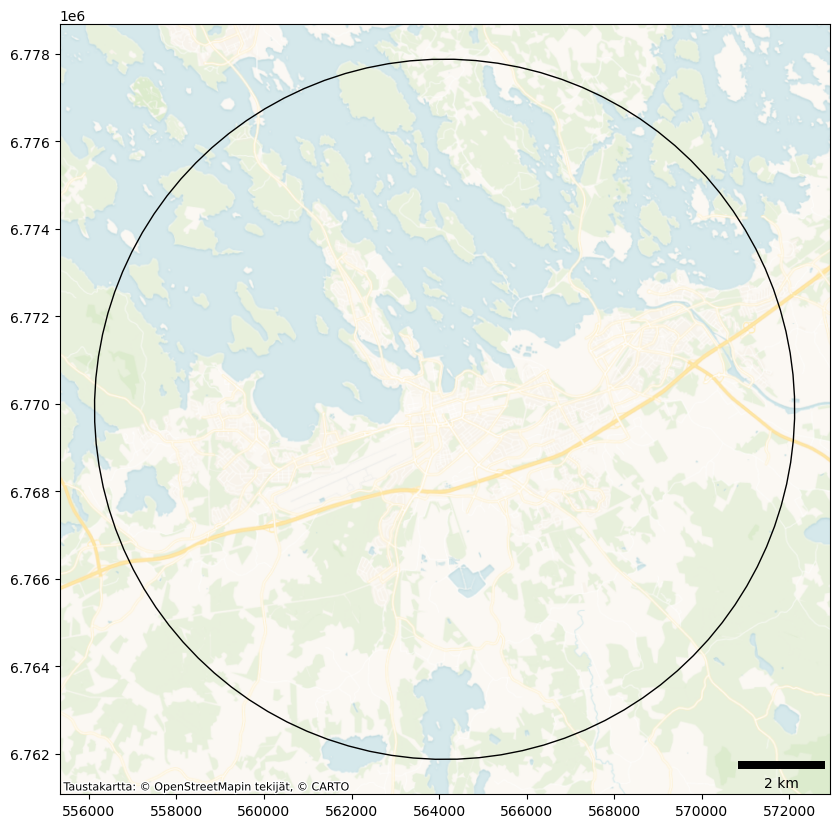

In [51]:
url='https://{s}.basemaps.cartocdn.com/rastertiles/voyager_nolabels/{z}/{x}/{y}{r}.png'
credits = "Taustakartta: © OpenStreetMapin tekijät, © CARTO"
    
# Test here background map
ax = buf.loc[buf["name"]==city].plot(figsize=(10, 10), facecolor="none", edgecolor="black")

ctx.add_basemap(ax, 
                zoom=12, 
                #source=ctx.providers.CartoDB.Positron, 
                #source=ctx.providers.Stamen.TerrainBackground,
                source=url,
                crs=buf.crs.to_string(),
                attribution=credits
               )

ax.add_artist(ScaleBar(1, location="lower right", box_alpha=0))

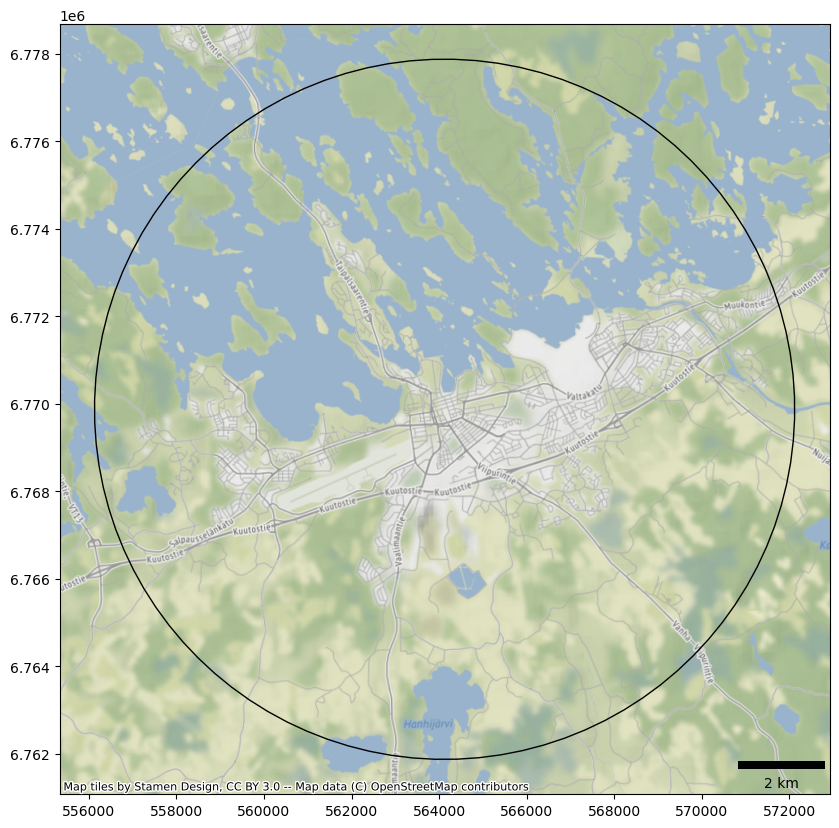

In [52]:
# Test here background map
ax = buf.loc[buf["name"]==city].plot(figsize=(10, 10), facecolor="none", edgecolor="black")

ctx.add_basemap(ax, 
                zoom=12, 
                #source=ctx.providers.CartoDB.Positron, 
                #source=ctx.providers.Stamen.TerrainBackground,
                source=ctx.providers.Stamen.Terrain,
                crs=buf.crs.to_string(),
                #attribution=credits
               )

ax.add_artist(ScaleBar(1, location="lower right", box_alpha=0))
    

In [53]:
# Reduce amount of data being plotted (speeds things up and helps adjusting zoom level)
buffer = buf.copy()
buffer.geometry = buf.geometry.buffer(5000)
buffer = buffer.to_crs(result.crs).loc[buf["name"]==city]

# Subset nodes to city center extent
subset_nodes = subset_result(result, buffer, city)

In [54]:
subset_nodes = subset_nodes.to_crs(buf.crs)

In [55]:
meantime = time.time()
current_time = str(datetime.timedelta(seconds=round(meantime - start, 0)))
print("Notebook execution time so far: ", current_time)

Notebook execution time so far:  0:01:07


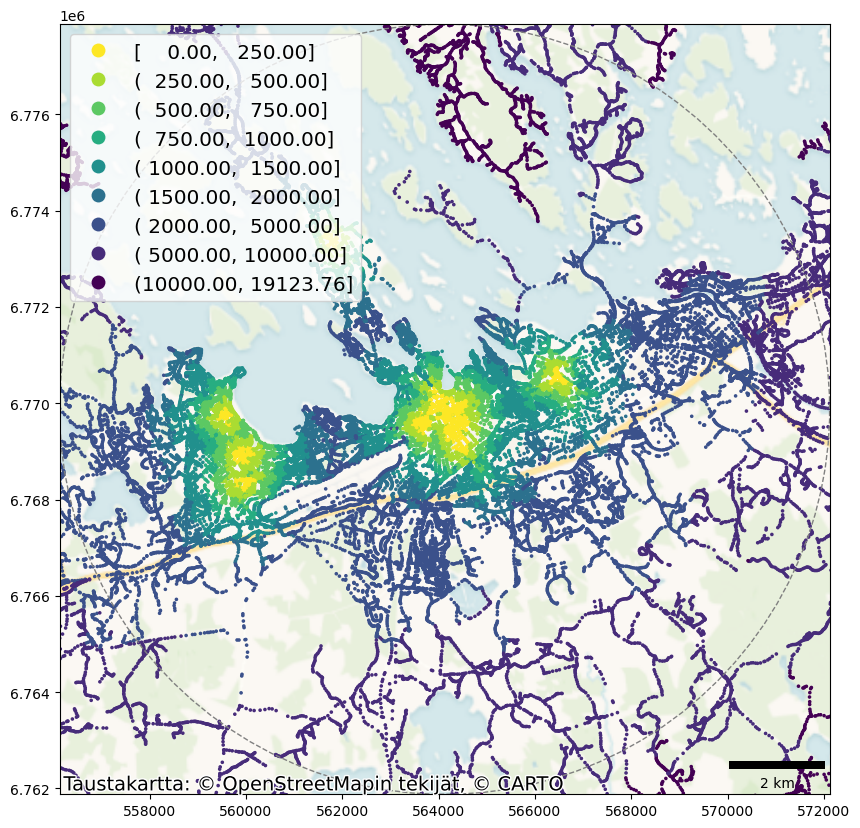

In [56]:
# Test here background map with one column
ax = subset_nodes[subset_nodes[service_category].notnull()].plot(column=f"dist_{service_category}",
    #cmap='YlOrRd', 
    cmap="viridis_r",#'autumn',
    markersize=2.5, 
    legend=True, 
    figsize=(10, 10), 
    scheme="user_defined", 
    classification_kwds={'bins':bins},
    #k=5,
    legend_kwds=dict(loc='upper left',
    fontsize='x-large')
        )

buf.loc[buf["name"]==city].plot(ax=ax, facecolor="none", edgecolor="grey", linestyle="--")

ctx.add_basemap(ax, 
                zoom=11, 
                #source=ctx.providers.CartoDB.Positron, 
                #source=ctx.providers.Stamen.TerrainBackground,
                #source=ctx.providers.Stamen.Terrain 
                source=url,
                crs=buf.crs.to_string(),
                attribution=credits,
                attribution_size=14
               )

ax.set_xlim(bbox[0], bbox[2])
ax.set_ylim(bbox[1], bbox[3])
    
ax.add_artist(ScaleBar(1, location="lower right", box_alpha=0))


### Plot maps and save to png

D:\ProgramFiles\Anaconda3\envs\python-gis\lib\site-packages\geopandas\geodataframe.py:422: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:
D:\ProgramFiles\Anaconda3\envs\python-gis\lib\site-packages\geopandas\geodataframe.py:422: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:
D:\ProgramFiles\Anaconda3\envs\python-gis\lib\site-packages\geopandas\geodataframe.py:422: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:
D:\ProgramFiles\Anaconda3\envs\python-gis\lib\site-packages\geopandas\geodataframe.py:422: RuntimeWarning: Sequential read of iterator was interrupted. Resetting iterator. This can negatively impact the performance.
  for feature in features_lst:
D:\ProgramFi

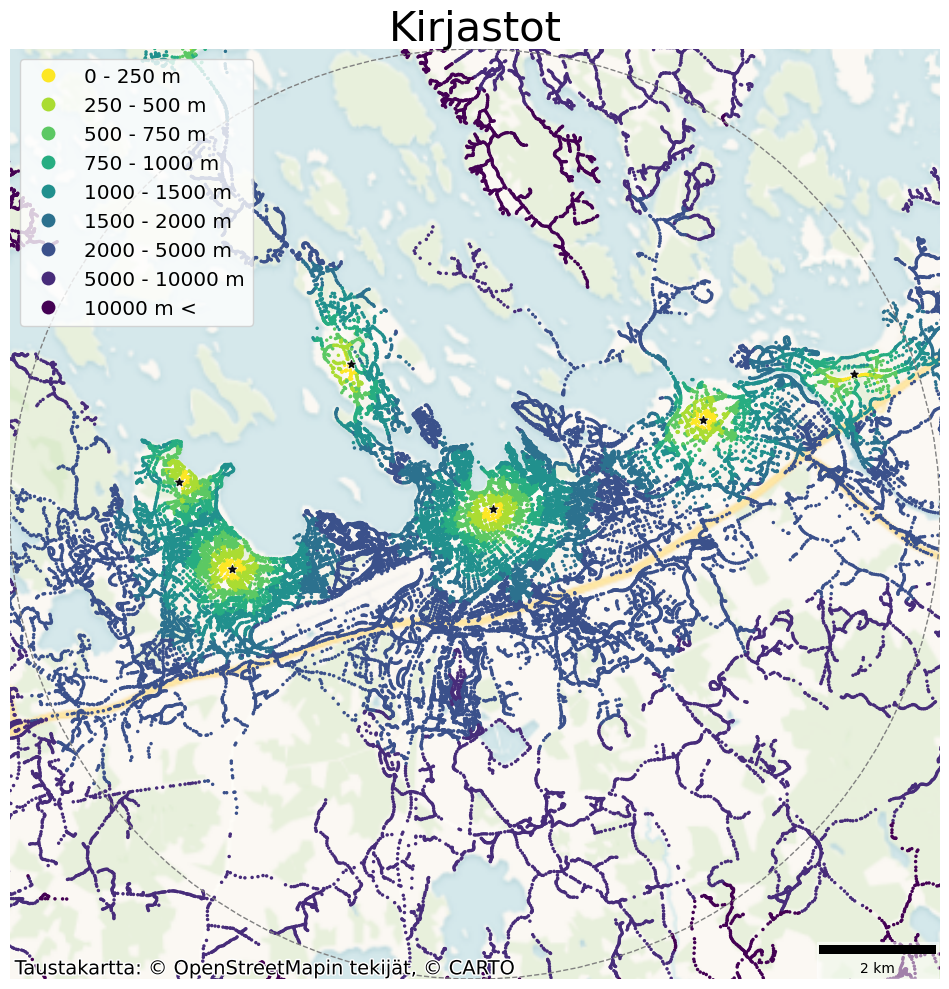

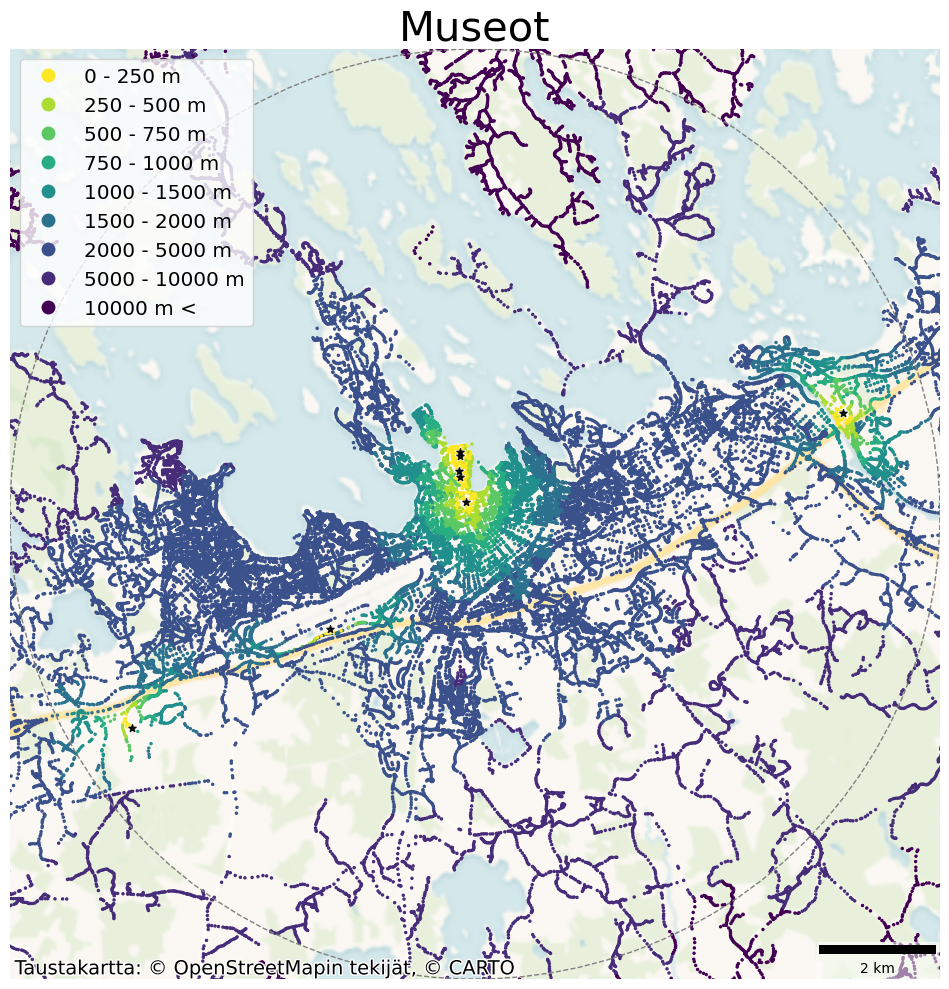

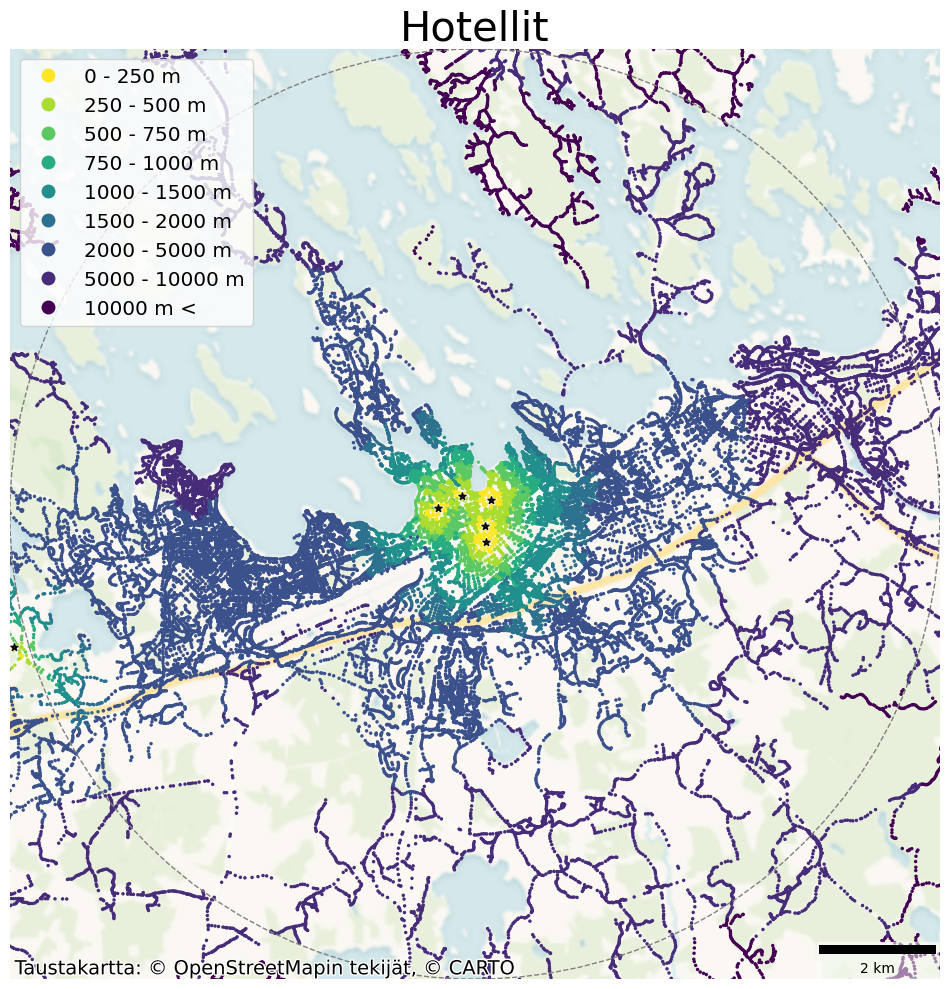

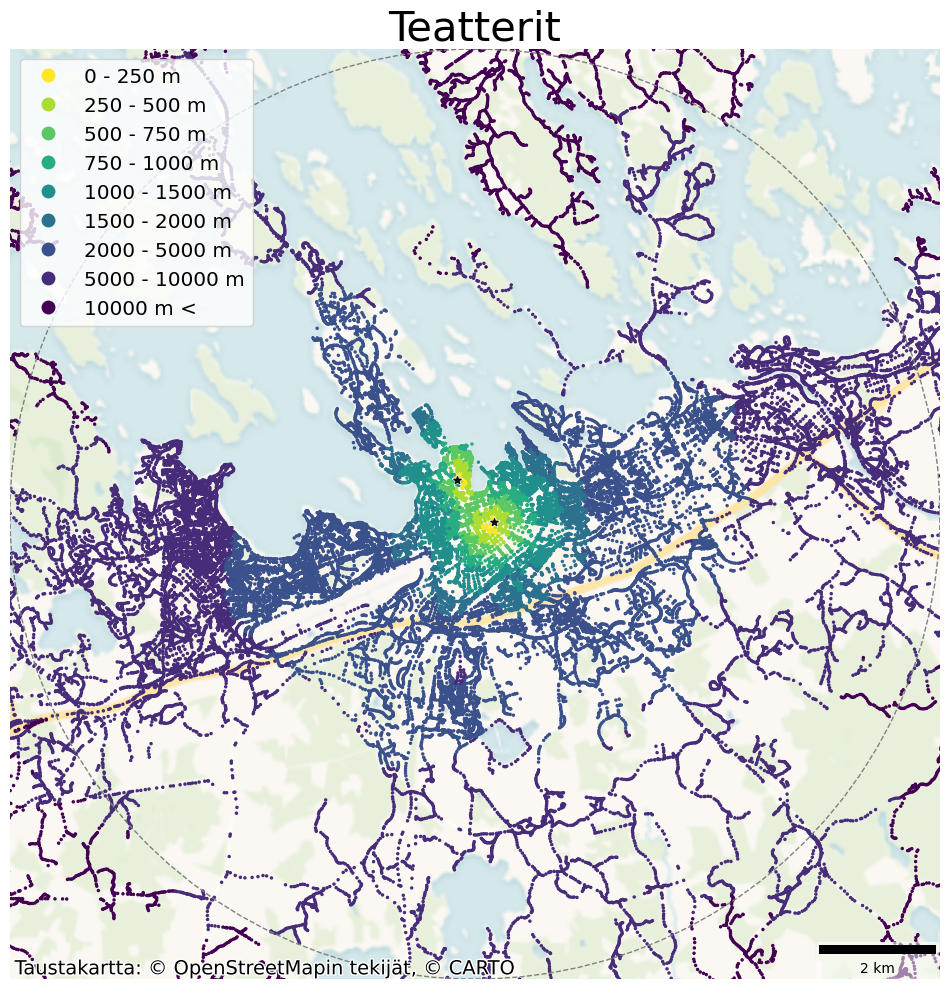

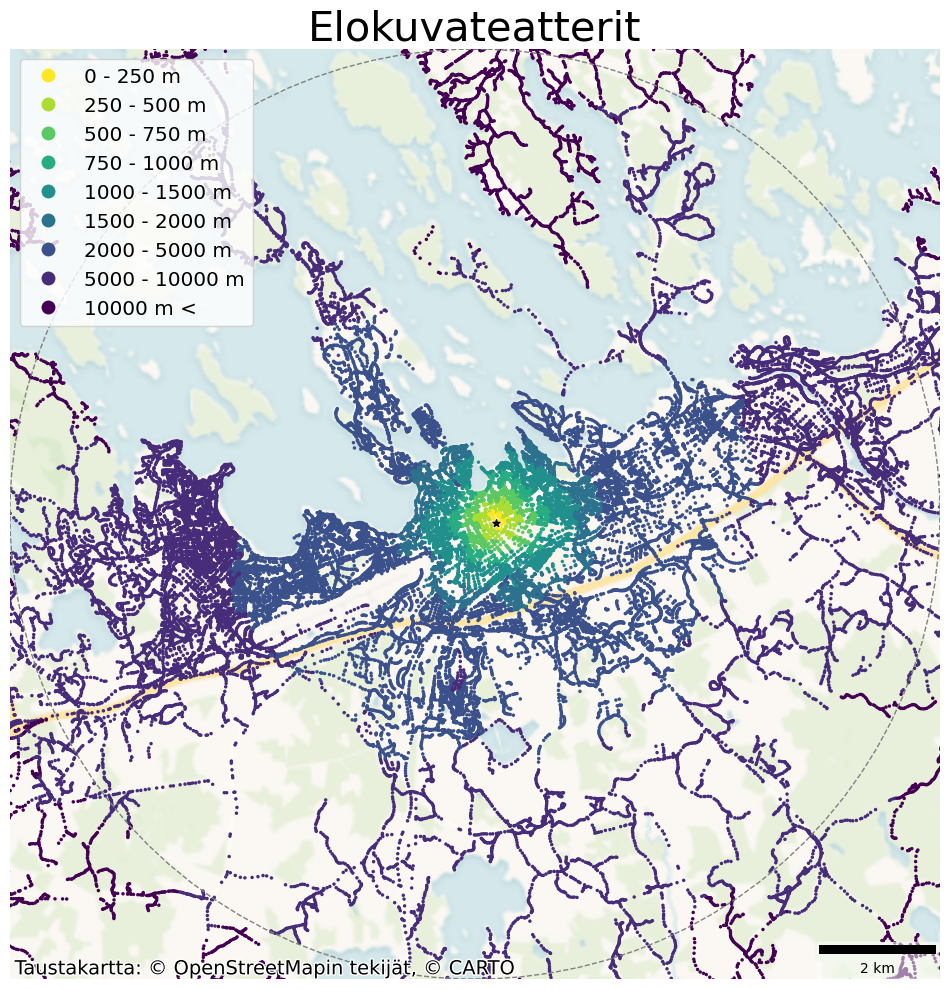

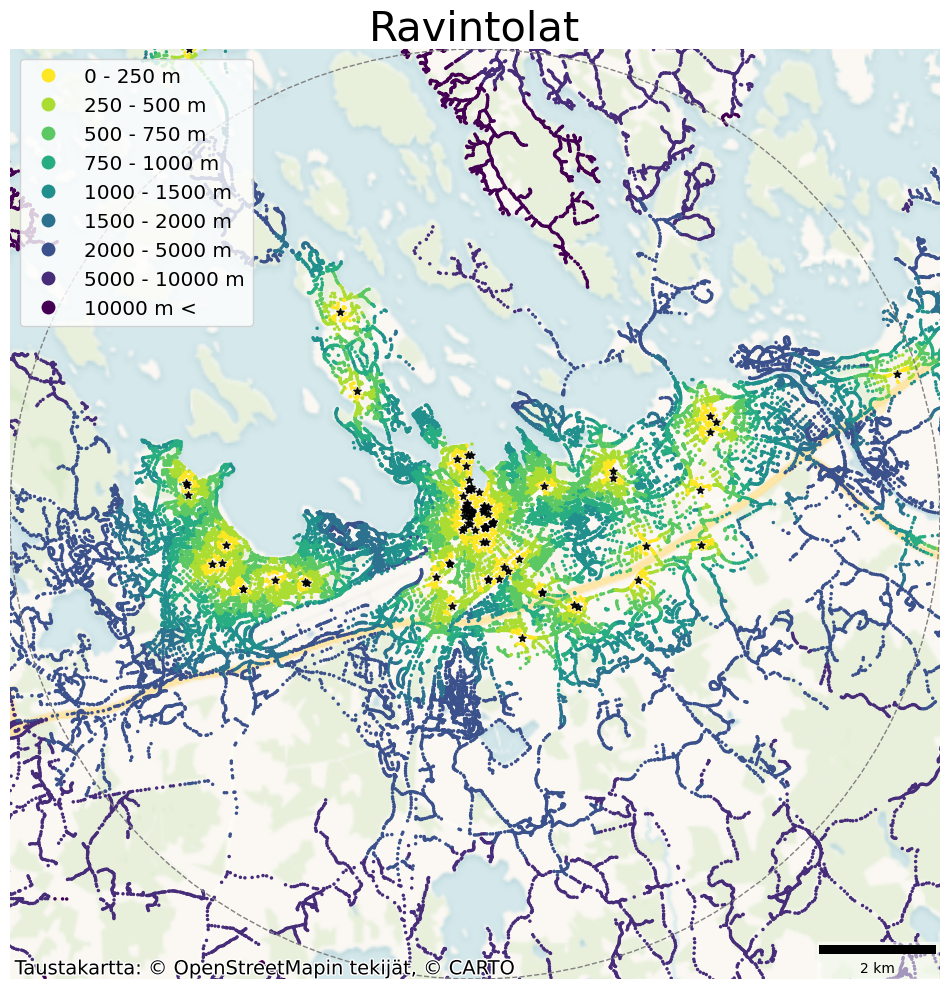

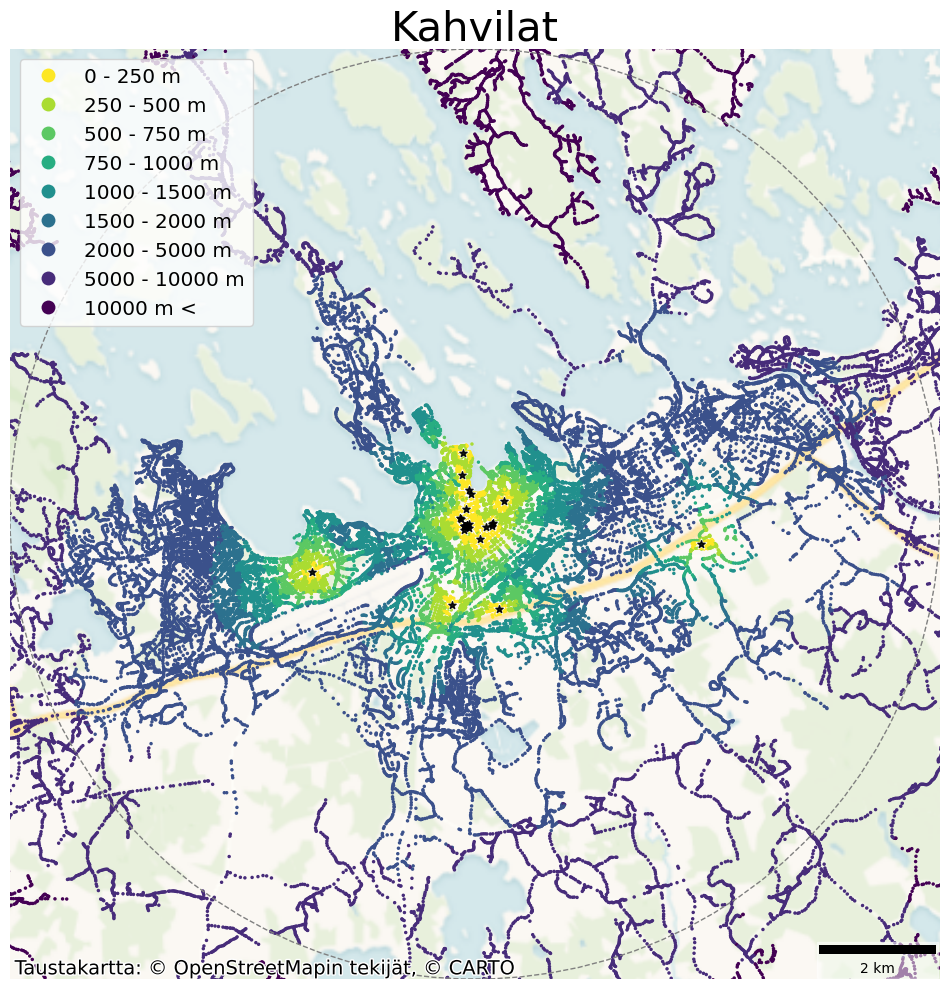

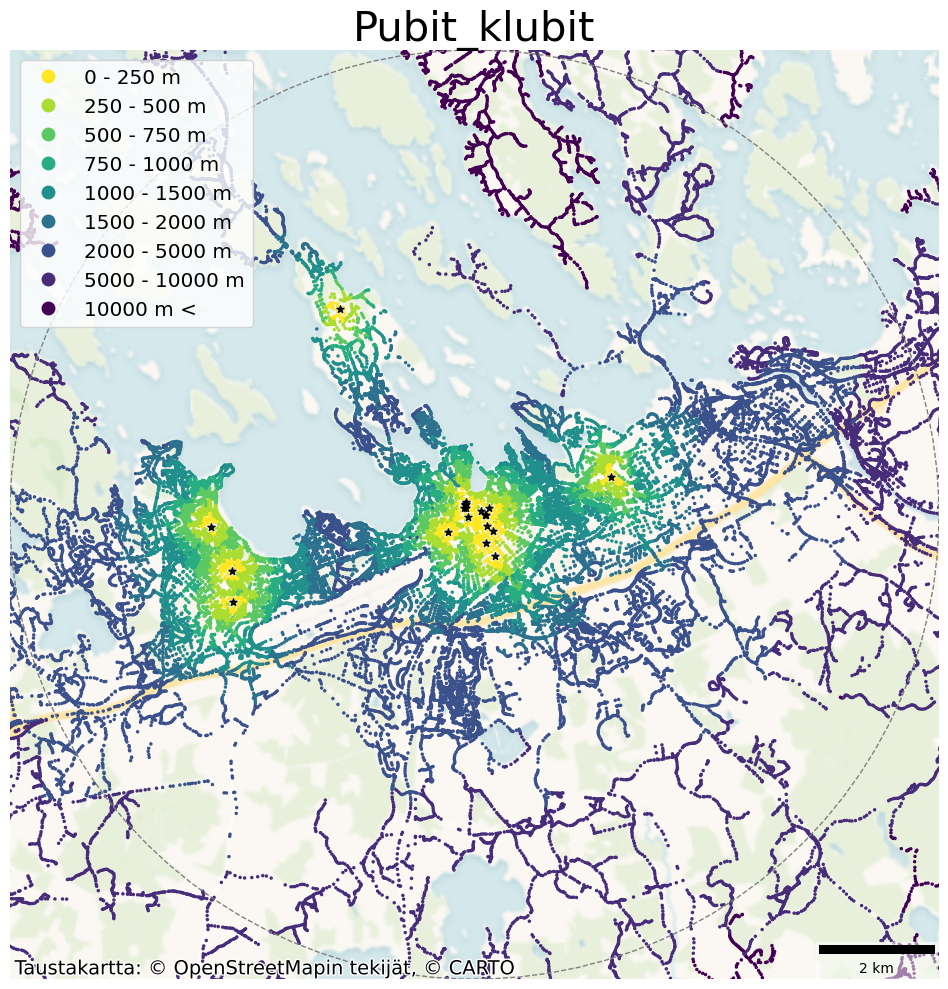

In [57]:
# Layernames for OSM data:
categories = fp_dicts.osm.keys()

for service_category in categories:
    try:
        # Read in the original file to plot the actual locations
        layername = fp_dicts.osm.get(service_category)
        service = gpd.read_file(osm_gpkg, layer=layername, driver="GPKG")

        # Plot the nodes with distance info
        ax = subset_nodes[subset_nodes[service_category].notnull()].plot(column=f"dist_{service_category}",
            #cmap='YlOrRd', 
            cmap="viridis_r", #'autumn',
            markersize=2.2, 
            legend=True, 
            figsize=(10, 10), 
            scheme="user_defined", 
            classification_kwds={'bins': bins},
            #k=5,
            legend_kwds=dict(loc='upper left',
            fontsize='x-large')
                )

        # subset to case area (to avoid edge effects etc.)
        service = subset_result(service, buffer, city)

        # Plot service locations twice for "halo" effect
        service.to_crs(buf.crs).plot(ax=ax, markersize=mark1, color="white", marker="*", alpha=0.9)
        service.to_crs(buf.crs).plot(ax=ax, markersize=mark2, color="black", marker="*", alpha=0.9)
        
        # Add 8 km buffer to figure
        buf.to_crs(buf.crs).loc[buf["name"]==city].plot(ax=ax, facecolor="none", edgecolor="grey", linestyle="--")

        # Add basemap 
        ctx.add_basemap(ax, 
                        zoom=11, 
                        #source=ctx.providers.CartoDB.Positron, 
                        #source=ctx.providers.Stamen.Terrain, 
                        source=url,
                        crs=buf.crs.to_string(),
                        attribution=credits, 
                        attribution_size=14
                       )

        # get all the legend labels
        legend_labels = ax.get_legend().get_texts()

        # replace the legend labels
        for bound, legend_label in zip(bounds, legend_labels):
            legend_label.set_text(bound)

        ax.set_xlim(bbox[0], bbox[2])
        ax.set_ylim(bbox[1], bbox[3])
        
        # add scalebar
        ax.add_artist(ScaleBar(1, location="lower right", box_alpha=0.5))

        #plt.title("Etäisyys lähimpään palveluun: " + service_category, fontsize=30)
        plt.title(service_category.capitalize(), fontsize=30)

        plt.axis('off')

        plt.tight_layout()

        plt.savefig(fr"../img/{city}_distance_to_closest_{service_category}.png", 
                    #dpi=300
                   )
        
        plt.ioff()
    except:
        print("cound not read", service_category)

In [58]:
meantime = time.time()
current_time = str(datetime.timedelta(seconds=round(meantime - start, 0)))
print("Notebook execution time so far: ", current_time)

Notebook execution time so far:  0:03:36


## Next steps

Next, it's possible to:
- Join the results to buildings. To detect nearest node for each building using See pandana [get_node_ids()](https://udst.github.io/pandana/network.html#pandana.network.Network.get_node_ids))
- Alternatively, add building locations to the input network prior to this analysis. See [This toolbox](https://github.com/ywnch/toolbox/blob/master/toolbox.py) by Yuwen Chang for one approach.
- Aggregate the results, e.g. to statistical grids (spatial join), see short example in this notebook.
- Visualize further, discover patterns!
- See also separate notebook for looking into the diversity of activities in walking zones